# Comparison of different Bayesian models under random noise effect


In [1]:
# Imports & preperation code
%load_ext autoreload
%autoreload 2

import seaborn
import numpy
from adaptive_nof1.models import Model, SelfExperimentationModel
from adaptive_nof1.basic_types import Outcome, History

from adaptive_nof1 import SeriesOfSimulationsRunner, SeriesOfSimulationsData
from adaptive_nof1.policies import (
    FixedPolicy,
    ThompsonSampling,
    BalancedThompsonSampling,
    ClippedThompsonSampling,
    ComposedPolicy,
    StoppingPolicy,
)
from adaptive_nof1.inference import (
    BayesianLinearRegressionModel,
    ConjugateNormalModel,
    Nof1Function,
    ConstantProbability,
    NormalKnownVariance,
)
from adaptive_nof1.helpers import *
from adaptive_nof1.basic_types import *
from adaptive_nof1.series_of_simulations_runner import simulate_configurations
from adaptive_nof1.metrics import SimpleRegret, RegretAgainstOtherConfiguration
import matplotlib.pyplot as plt
import holoviews
import pandas
import param
import panel
from functools import reduce

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## Methodology

We will use a simple simulation model, and explore the effects of different models for generating thompson sampling probabilities.

## Simulation Model
We assume $y \sim N(0, 1)$


## Policies
We start with three policies for comparison:
- Fixed Design
- Thompson Sampling with 50/50 (the true probabilities)
- Thompson Sampling with Conjugate Normal Model
- Thompson Sampling with Bayesian Linear Regression
- Thompson Sampling with Nof1Function, the implementation of Chris

## Evaluation



In [2]:
# Code for setting priors
conjugate_normal_model_priors = {
    "mean": 0,
    "l": 0.5,
    "alpha": 10,
    "beta": 10,
}

## Priors used for Nof1Function (currently hardcoded)
# beta.prior      = list("dunif", 10, 20),
# hy.prior        = list("dunif", 0, 1000),

In [3]:
# Prepare simulation constants
N_INTERVENTIONS = 2
LENGTH = 40
N_PATIENTS = 10

In [4]:
# Define models
class NormalModel(Model):
    def __init__(self, patient_id, means=[0, 0]):
        self.patient_id = patient_id
        self.rng = numpy.random.default_rng(patient_id)
        self.means = means

    def generate_context(self, history: History) -> Context:
        return {}

    def observe_outcome(self, action, context) -> Observation:
        return {"outcome": self.rng.normal(self.means[action["treatment"]], 1)}

    def __str__(self):
        return f"NormalModel{self.means}"


data_generating_model = lambda patient_id: NormalModel(patient_id)

In [5]:
# Define policies

fixed_policy = FixedPolicy(number_of_actions=N_INTERVENTIONS)
two_means_ts = ThompsonSampling(
    inference_model=ConjugateNormalModel(**conjugate_normal_model_priors),
    number_of_actions=N_INTERVENTIONS,
)

linear_regression_ts = ThompsonSampling(
    inference_model=BayesianLinearRegressionModel(
        mean=numpy.array([0, 0]),
        v=numpy.eye(2),
        alpha=1,
        beta=1,
    ),
    number_of_actions=N_INTERVENTIONS,
)

nof1_ts = ThompsonSampling(
    inference_model=Nof1Function(),
    number_of_actions=N_INTERVENTIONS,
)


constant_ts = ThompsonSampling(
    inference_model=ConstantProbability([0.5, 0.5]),
    number_of_actions=N_INTERVENTIONS,
)

R[write to console]: Zusätzlich: 
R[write to console]: Warnmeldung:

R[write to console]: package ‘~/Documents/code/nofone’ is not available for this version of R

A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages 



In [6]:
# Full crossover study
study_designs = {
    "n_patients": [N_PATIENTS],
    "policy": [nof1_ts, two_means_ts, linear_regression_ts, constant_ts],
    # "policy": [two_means_ts, linear_regression_ts, constant_ts],
    "model_from_patient_id": [
        data_generating_model,
    ],
}
configurations = generate_configuration_cross_product(study_designs)

In [7]:
calculated_series, config_to_simulation_data = simulate_configurations(
    configurations, LENGTH
)

  0%|          | 0/40 [00:00<?, ?it/s]

TypeError: 'method' object is not a mapping

In [62]:
def plot_allocations_for_calculated_series(calculated_series):
    panels = [series["result"].plot_allocations() for series in calculated_series]
    for panel, i in zip(panels, range(len(panels))):
        panel.opts(
            title=f"{calculated_series[i]['configuration']['policy']}, {calculated_series[i]['configuration']['model']}",
            fontsize={"title": "80%"},
        )
    return holoviews.Layout(panels).cols(1)


plot_allocations_for_calculated_series(calculated_series)

/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(
/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_scroll' property; using the latest value
  layout_plot = gridplot(


:Layout
   .HeatMap.I   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)
   .HeatMap.II  :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)
   .HeatMap.III :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)
   .HeatMap.IV  :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)

In [58]:
class PatientExplorer(param.Parameterized):
    patient_id = param.Integer(default=0, bounds=(0, N_PATIENTS - 1))
    configuration = param.Integer(default=0, bounds=(0, len(calculated_series) - 1))
    t = param.Integer(default=10, bounds=(0, LENGTH - 1))

    @param.depends("patient_id", "configuration")
    def hvplot(self):
        debug_data = (
            calculated_series[self.configuration]["result"]
            .simulations[self.patient_id]
            .history.debug_data()
        )
        df = pandas.DataFrame([flatten_dictionary(d) for d in debug_data])
        return df.hvplot()

    @param.depends("configuration")
    def configuration_name(self):
        return panel.panel(calculated_series[self.configuration]["configuration"])

    @param.depends("patient_id", "configuration", "t")
    def posterior(self):
        debug_data = (
            calculated_series[self.configuration]["result"]
            .simulations[self.patient_id]
            .history.debug_data()
        )
        posterior_parameters = debug_data[self.t].copy()

        if (
            calculated_series[self.configuration]["configuration"]["policy"]
            == "ThompsonSampling(BayesianLinearRegression)"
        ):
            del posterior_parameters["probabilities"]
            model = BayesianLinearRegressionModel(
                **posterior_parameters,
            )
        elif (
            calculated_series[self.configuration]["configuration"]["policy"]
            == "ThompsonSampling(ConjugateNormalModel)"
        ):
            del posterior_parameters["probabilities"]
            model = ConjugateNormalModel(
                **posterior_parameters,
            )
        else:
            return
        curves = []
        for intervention in range(N_INTERVENTIONS):
            rv = model.posterior(intervention)
            x = numpy.linspace(rv.ppf(0.01), rv.ppf(0.99), 100)
            curves += [zip(x, rv.pdf(x))]
        return reduce(
            lambda x, y: x * y, [holoviews.Curve(curve) for curve in curves]
        ).opts(xlim=(-4, 4), ylim=(0.0, 0.5))

    @param.depends("patient_id", "configuration", "t")
    def debug_data(self):
        debug_data = (
            calculated_series[self.configuration]["result"]
            .simulations[self.patient_id]
            .history.debug_data()[self.t]
        )
        return panel.panel(debug_data)

In [59]:
explorer = PatientExplorer()
hvplot = holoviews.DynamicMap(explorer.hvplot)
panel.Column(
    panel.Row(panel.Column(explorer.param, explorer.configuration_name), hvplot),
    explorer.posterior,
    explorer.debug_data,
)

Column
    [0] Row
        [0] Column
            [0] Column(margin=(5, 10), name='PatientExplorer')
                [0] StaticText(value='<b>PatientExplorer</b>')
                [1] IntSlider(end=9, name='Patient id')
                [2] IntSlider(end=3, name='Configuration')
                [3] IntSlider(end=39, name='T', value=10)
            [1] ParamMethod(method, _pane=JSON, defer_load=False)
        [1] HoloViews(DynamicMap, height=300, sizing_mode='fixed', width=700)
    [1] ParamMethod(method, _pane=Str, defer_load=False)
    [2] ParamMethod(method, _pane=Str, defer_load=False)

# Questions:
* Are the means of lower sampled probabilities negatively biased?
* Do all models converge at some point?

In [252]:
# Question 1: Are the means of lower sampled probabilitites negatively biased?
series_index = 0
print(f"config: {calculated_series[series_index]['configuration']}")
df = calculated_series[series_index]["result"]
df = df.pooled_histories().to_df()
df["moving_average"] = "t"
df.hvplot(x="t", y="outcome", groupby=["patient_id"], c="treatment")

config: {'policy': 'ThompsonSampling(ConjugateNormalModel)', 'model': 'NormalModel', 'pooling': False}


:DynamicMap   [patient_id]
   :Curve   [t]   (outcome,treatment)

         t  treatment   outcome  patient_id moving_average    cumsum  \
0        0          1  0.125730           0              t  0.125730   
400      0          1  0.345584           1              t  0.471314   
800      0          1  0.189053           2              t  0.660368   
1200     0          1  2.040919           3              t  2.701287   
1600     0          1 -0.651791           4              t  2.049496   
...    ...        ...       ...         ...            ...       ...   
38399  399          0 -0.018166          95              t  4.396565   
38799  399          0  2.351816          96              t  6.748381   
39199  399          1 -1.060681          97              t -7.163130   
39599  399          0 -0.334723          98              t  6.413658   
39999  399          0 -0.862287          99              t  5.551371   

       cumcount  cumulative_mean  
0             1         0.125730  
400           2         0.235657  
800           3         0.2201

<Axes: xlabel='t'>

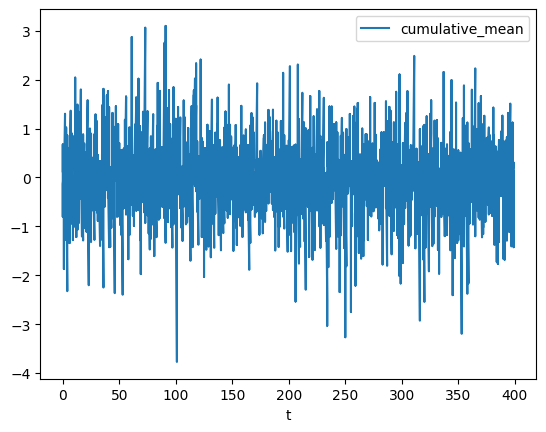

In [265]:
# Sort the DataFrame by 'patient_id', 'treatment', and 't'
df.sort_values(by=["t", "patient_id", "treatment"], inplace=True)

print(df)

# Display the DataFrame with the new 'cumulative_mean' column
print(df[["patient_id", "treatment", "t", "outcome", "cumulative_mean"]])

df[["t", "cumulative_mean"]].plot(x="t")
# df[df["t"] == 20]
# seaborn.lineplot(df, x="t", y="cumulative_mean", hue="patient_id")

In [169]:
# Do all models converge at some point?
linear_regression_ts = ThompsonSampling(
    inference_model=BayesianLinearRegressionModel(
        mean=numpy.array([0, 0]),
        v=numpy.eye(2) * 1.0,
        alpha=1,
        beta=100,
    ),
    number_of_actions=N_INTERVENTIONS,
)

runner = SeriesOfSimulationsRunner(
    model_from_patient_id=data_generating_model,
    policy=linear_regression_ts,
    n_patients=100,
)
series = runner.simulate(200)

  0%|          | 0/200 [00:00<?, ?it/s]

In [170]:
series.plot_allocations()

:HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)

# Story:
* We saw the very interesting behavior than sometimes, model get "sure" on one treatment when really we see noise.
* This phenomenon can be explained by a bias which is induced by adaptively sampling data.
* Doing this is somehow like doing a random walk?

In [6]:
# Testing different convergent models:

ts_1 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=1),
    number_of_actions=N_INTERVENTIONS,
)

ts_2 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=2),
    number_of_actions=N_INTERVENTIONS,
)

ts_0_5 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=0.5),
    number_of_actions=N_INTERVENTIONS,
)

ts_0_01 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=0.01),
    number_of_actions=N_INTERVENTIONS,
)

ts_0_001 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=0.001),
    number_of_actions=N_INTERVENTIONS,
)
ts_0_0001 = ThompsonSampling(
    inference_model=NormalKnownVariance(mean=0, variance=0.0001),
    number_of_actions=N_INTERVENTIONS,
)

In [71]:
# Full crossover study
study_designs = {
    "n_patients": [100],
    "policy": [ts_2, ts_1, ts_0_5, ts_0_01, ts_0_001, ts_0_0001],
    # "policy": [ts_0_001],
    "model_from_patient_id": [
        data_generating_model,
    ],
}
configurations = generate_configuration_cross_product(study_designs)

In [72]:
calculated_series_2, config_to_simulation_data_2 = simulate_configurations(
    configurations,
    200,
)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

In [73]:
# plot_allocations_for_calculated_series(calculated_series_2)

In [74]:
index = 0
print(calculated_series_2[index]["configuration"])
df = calculated_series_2[index]["result"].pooled_histories().to_df()

{'policy': 'ThompsonSampling(NormalKnownVariance(0, 2))', 'model': 'NormalModel', 'pooling': False}


In [75]:
# Test df
data = {
    "t": [0, 1, 2, 3, 4, 0, 1, 2, 3, 4],
    "treatment": [0, 1] * 5,
    "outcome": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    "patient_id": [0] * 5 + [1] * 5,
}

# df = pandas.DataFrame(data)
print(df)

         t  treatment   outcome  patient_id
0        0          1  0.125730           0
1        1          1  0.104900           0
2        2          1  1.304000           0
3        3          1 -1.265421           0
4        4          1 -2.325031           0
...    ...        ...       ...         ...
19995  195          0 -0.681473          99
19996  196          0 -1.129814          99
19997  197          1  0.257981          99
19998  198          0  1.303741          99
19999  199          0 -0.646982          99

[20000 rows x 4 columns]


In [76]:
df.loc[(df["treatment"] == 0) & (df["t"] == 2)]

,t,treatment,outcome,patient_id
602,2,0,-2.019986,3
802,2,0,-0.623464,4
1002,2,0,-0.552647,5
1202,2,0,0.653788,6
2002,2,0,0.843043,10
2202,2,0,0.569726,11
2402,2,0,-0.626955,12
2602,2,0,1.827259,13
3002,2,0,-1.443531,15
3202,2,0,0.544177,16


In [77]:
def create_cumulative_mean_df(df):
    data = {
        "t": [],
        "intervention": [],
        "mean": [],
        "patient_id": [],
    }
    for t in range(0, df["t"].max() + 1):
        for intervention in range(N_INTERVENTIONS):
            for patient_id in range(N_PATIENTS):
                data["t"].append(t)
                data["intervention"].append(intervention)
                data["patient_id"].append(patient_id)
                data["mean"].append(
                    df.loc[
                        (df["treatment"] == intervention)
                        & (df["patient_id"] == patient_id)
                        & (df["t"] <= t)
                    ]["outcome"].mean()
                )
        # d[f"outcomes_{intervention}"] = df.loc[(df['treatment'] == intervention)].groupby("t").sum()["outcome"]
        # d[f"outcome_count_{intervention}"] = (1 - d[f"outcomes_{intervention}"].isna()).cumsum()
        # d[f"outcome_count_{intervention}"] = (1 - d[f"outcomes_{intervention}"].isna()).cumsum()
        # d[f"outcome_sum_{intervention}"] = d[f"outcomes_{intervention}"].cumsum()
        # d[f"outcome_mean_{intervention}_with_nan"] = d[f"outcome_sum_{intervention}"] / d[f"outcome_count_{intervention}"]
        # d[f'cumulative_mean_{intervention}'] = d[f'outcome_mean_{intervention}_with_nan'].ffill()
    return pandas.DataFrame(data)


mean_df = create_cumulative_mean_df(df)
mean_df

,t,intervention,mean,patient_id
0,0,0,NaN,0
1,0,0,NaN,1
2,0,0,0.189053,2
3,0,0,2.040919,3
4,0,0,NaN,4
...,...,...,...,...
3995,199,1,-0.038835,5
3996,199,1,-0.023343,6
3997,199,1,-0.215047,7
3998,199,1,-0.065915,8


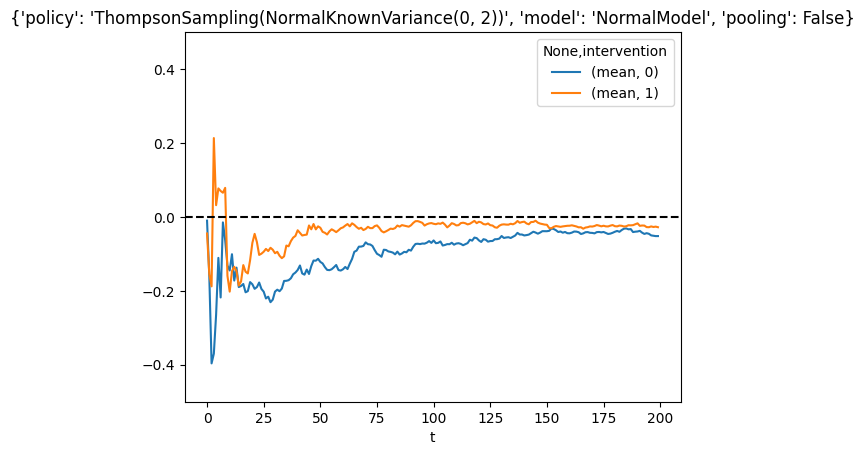

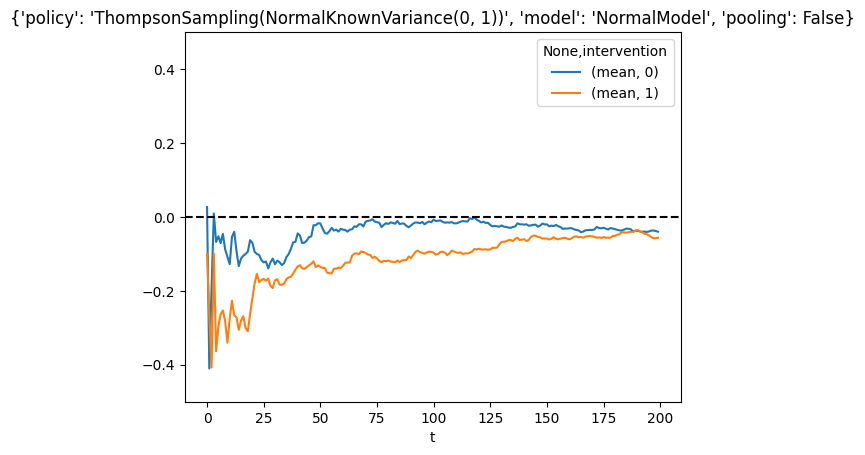

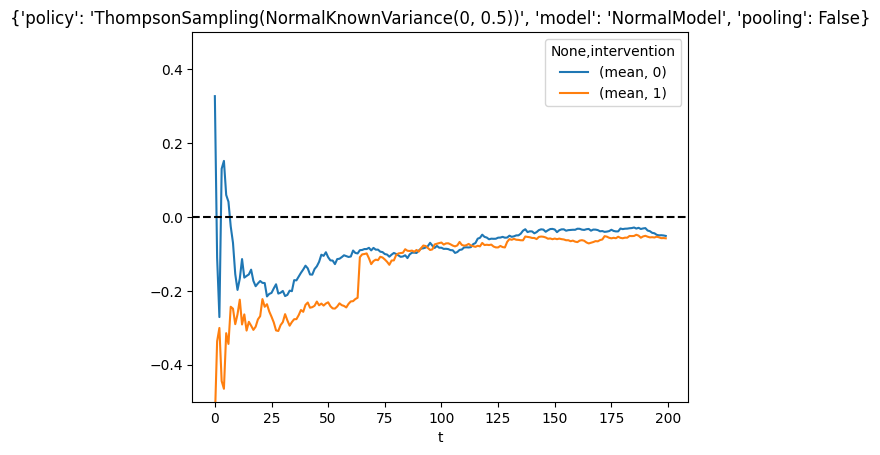

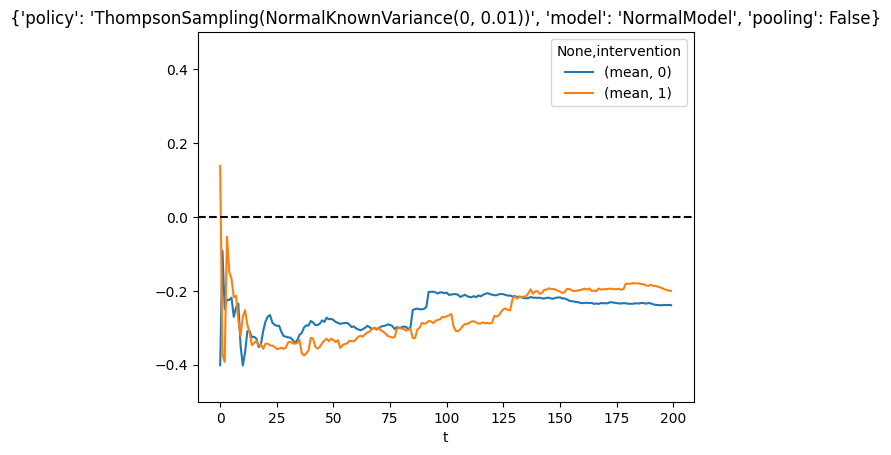

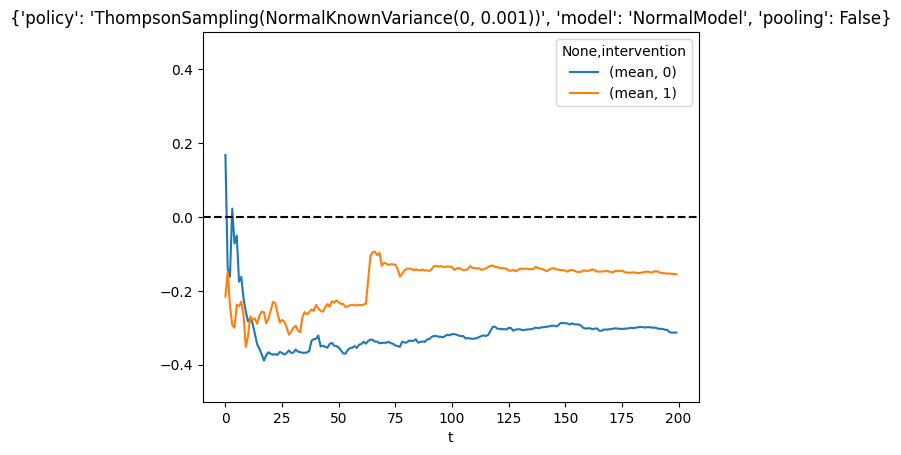

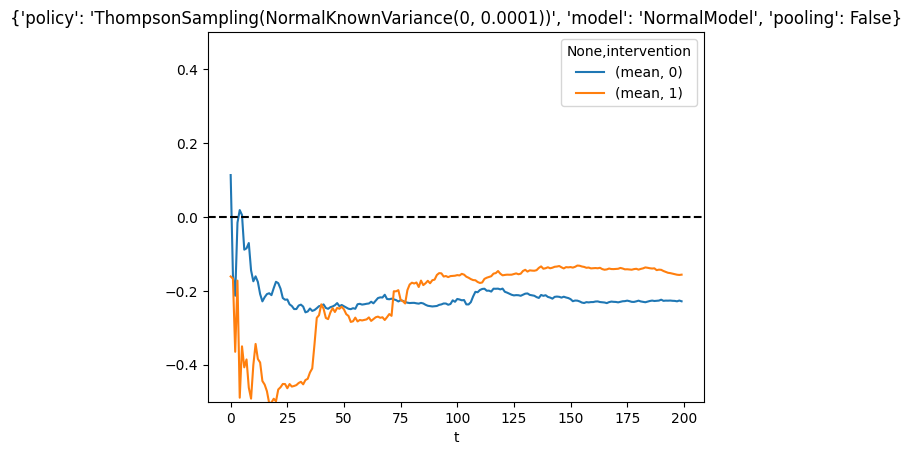

In [295]:
dfs = []


def plot_bias(calculated_series):
    for entry in calculated_series:
        df = entry["result"].pooled_histories().to_df()
        mean_df = create_cumulative_mean_df(df)
        mean_df_copy = mean_df.copy()
        mean_df_copy["model"] = str(entry["configuration"]["policy"])
        dfs.append(mean_df_copy)
        mean_df.pivot_table(columns="intervention", index=["t", "patient_id"]).groupby(
            "t"
        ).mean().plot(title=str(entry["configuration"]), ylim=(-0.5, 0.5))
        plt.axhline(0, color="black", linestyle="--")


plot_bias(calculated_series_2)

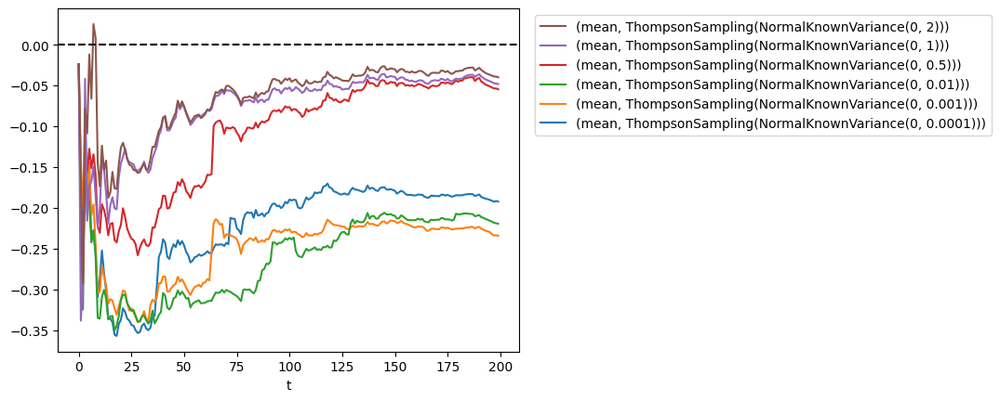

In [294]:
dfs
pdfs = pandas.concat(dfs)
pdfs.pivot_table(
    columns=["model"], index=["t", "patient_id", "model", "intervention"]
).groupby("t").mean().plot()

handles, labels = plt.gca().get_legend_handles_labels()

# Reverse the order of legend items
handles.reverse()
labels.reverse()

# Create a legend with the reversed order
plt.legend(handles, labels, loc="upper left", bbox_to_anchor=(1.02, 1))
plt.axhline(0, color="black", linestyle="--")
# plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [184]:
fixed_policy = FixedPolicy(
    number_of_actions=N_INTERVENTIONS,
)
data_generating_model_2 = lambda patient_id: NormalModel(patient_id, means=[0, 0.4])
study_designs = {
    "n_patients": [40],
    # "policy": [ts_2, ts_1, ts_0_5, ts_0_01, ts_0_001, ts_0_0001],
    "policy": [ts_0_5, ts_0_0001, fixed_policy],
    "model_from_patient_id": [
        data_generating_model_2,
    ],
}
configurations = generate_configuration_cross_product(study_designs)
calculated_series_3, config_to_simulation_data_3 = simulate_configurations(
    configurations, LENGTH
)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [185]:
plot_allocations_for_calculated_series(calculated_series_3)

/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_drag' property; using the latest value
  layout_plot = gridplot(
/opt/homebrew/Caskroom/miniconda/base/envs/mt/lib/python3.11/site-packages/holoviews/plotting/bokeh/plot.py:987: UserWarning: found multiple competing values for 'toolbar.active_scroll' property; using the latest value
  layout_plot = gridplot(


:Layout
   .HeatMap.I   :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)
   .HeatMap.II  :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)
   .HeatMap.III :HeatMap   [t,patient_id]   (treatment,debug_info,context,outcome,counterfactual_outcomes,debug_data,treatment)

<Axes: xlabel='t', ylabel='Regret'>

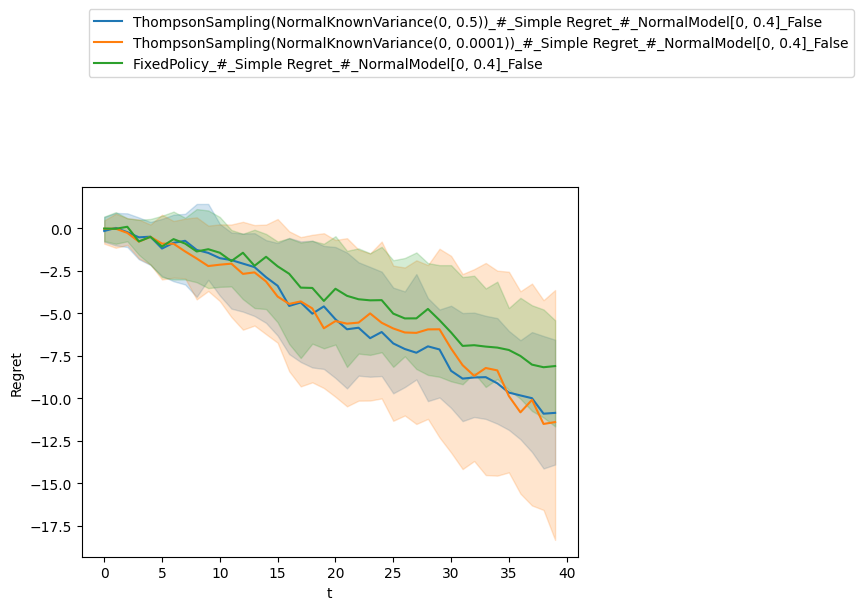

In [186]:
SeriesOfSimulationsData.plot_lines(
    [series["result"] for series in calculated_series_3],
    [SimpleRegret()],
    legend_position=(0, 1.5),
)

In [187]:
scores = SeriesOfSimulationsData.score_data(
    [series["result"] for series in calculated_series_3],
    [SimpleRegret()],
)

scores = scores[scores["t"] == scores["t"].max()]
table = pandas.DataFrame()
table["mean_regret"] = scores.groupby(["policy", "model"])["score"].mean()
table["median_regret"] = scores.groupby(["policy", "model"])["score"].median()
table[".25 quantile regret"] = scores.groupby(["policy", "model"])["score"].quantile(
    0.25
)
table[".75 quantile regret"] = scores.groupby(["policy", "model"])["score"].quantile(
    0.75
)
table[".95 quantile regret"] = scores.groupby(["policy", "model"])["score"].quantile(
    0.95
)
table[".05 quantile regret"] = scores.groupby(["policy", "model"])["score"].quantile(
    0.05
)
table.swaplevel("policy", "model").sort_index()
table

,,mean_regret,median_regret,.25 quantile regret,.75 quantile regret,.95 quantile regret,.05 quantile regret
policy,model,,,,,,
FixedPolicy,"NormalModel[0, 0.4]",-8.23098,-8.103506,-11.650642,-5.409881,2.290859,-18.113802
"ThompsonSampling(NormalKnownVariance(0, 0.0001))","NormalModel[0, 0.4]",-11.08098,-11.399942,-18.331773,-3.632296,1.046028,-25.313956
"ThompsonSampling(NormalKnownVariance(0, 0.5))","NormalModel[0, 0.4]",-10.41098,-10.857688,-13.896674,-6.553071,-1.650125,-22.605249


(0.0, 5.0)

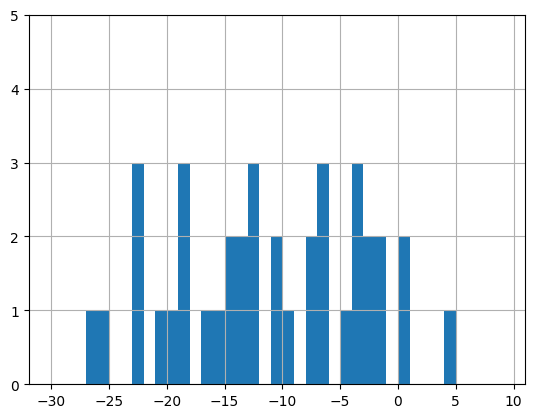

In [203]:
scores.loc[
    scores["policy"] == "ThompsonSampling(NormalKnownVariance(0, 0.0001))"
].groupby("policy")["score"].hist(bins=range(-30, 10))
plt.ylim(0, 5)

In [266]:
history = History(
    observations=[
        Observation(
            context={"activity": 30},
            treatment={"treatment": 0},
            outcome={"outcome": -0.05},
            t=0,
            patient_id=0,
        ),
        Observation(
            context={"activity": 30},
            treatment={"treatment": 0},
            outcome={"outcome": 0},
            t=1,
            patient_id=0,
        ),
        Observation(
            context={"activity": 30},
            treatment={"treatment": 1},
            outcome={"outcome": 0},
            t=2,
            patient_id=0,
        ),
        Observation(
            context={"activity": 30},
            treatment={"treatment": 1},
            outcome={"outcome": 0.01},
            t=3,
            patient_id=0,
        ),
    ]
)


data = []
for s in [ts_2, ts_1, ts_0_5, ts_0_01, ts_0_001, ts_0_0001]:
    model = s.inference
    model.update_posterior(history, N_INTERVENTIONS)
    print(
        s.inference.variance,
        ",",
        model.approximate_max_probabilities(N_INTERVENTIONS, {}),
    )
    probabilities = model.approximate_max_probabilities(N_INTERVENTIONS, {})
    data.append(
        {
            "variance": s.inference.variance,
            "p_0_better": probabilities[0],
            "p_1_better": probabilities[1],
        }
    )

2 , [0.5001 0.4999]
1 , [0.4961 0.5039]
0.5 , [0.4859 0.5141]
0.01 , [0.0232 0.9768]
0.001 , [0. 1.]
0.0001 , [0. 1.]


Text(0, 0.5, 'P (T_0 < T_1)')

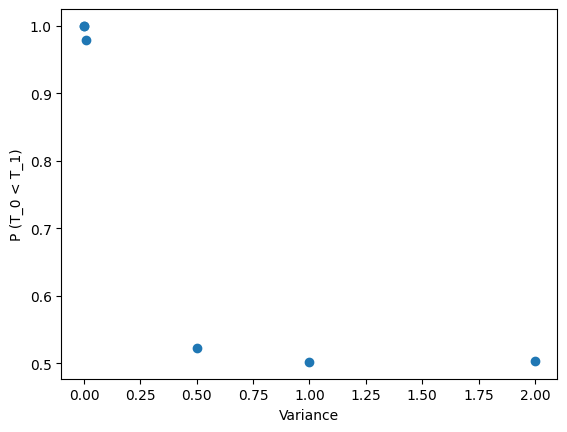

In [289]:
df = pandas.DataFrame(data)
plt.scatter(df["variance"], df["p_1_better"])
plt.xlabel("Variance")
plt.ylabel("P (T_0 < T_1)")